# <p><center style="font-family:newtimeroman;font-size:180%;"> Bone Fracture Classification and Quality Evaluation Using Image Analysis </center></p>
### Table of contents:

* [Import Libraries](#1)
* [Read Data](#2)
* [Visualization Of Dataset](#3)
* [Data Augmentation](#4)
* [Train MobileViT Model](#5)
* [Evaluate The Model](#6)

![](https://i.imgur.com/mANnhI7.png)


**<a id="1"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Import Libraries </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [4]:
import os 
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras 
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
import numpy as np

In [5]:
print(tf.__version__) 
print(keras.__version__) 
print(np.__version__) 

2.13.0
2.13.1
1.26.4


**<a id="2"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Read Data </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [6]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

In [7]:
#train
train=data('/kaggle/input/bone-fracture/dataset/train')
train.head()

,image,label
0,/kaggle/input/bone-fracture/dataset/train/not ...,not fractured
1,/kaggle/input/bone-fracture/dataset/train/not ...,not fractured
2,/kaggle/input/bone-fracture/dataset/train/not ...,not fractured
3,/kaggle/input/bone-fracture/dataset/train/not ...,not fractured
4,/kaggle/input/bone-fracture/dataset/train/not ...,not fractured


In [8]:
#test
test=data('/kaggle/input/bone-fracture/dataset/test')
test.head()

,image,label
0,/kaggle/input/bone-fracture/dataset/test/not f...,not fractured
1,/kaggle/input/bone-fracture/dataset/test/not f...,not fractured
2,/kaggle/input/bone-fracture/dataset/test/not f...,not fractured
3,/kaggle/input/bone-fracture/dataset/test/not f...,not fractured
4,/kaggle/input/bone-fracture/dataset/test/not f...,not fractured


In [9]:
#val
val=data('/kaggle/input/bone-fracture/dataset/val')
val.head()

,image,label
0,/kaggle/input/bone-fracture/dataset/val/not fr...,not fractured
1,/kaggle/input/bone-fracture/dataset/val/not fr...,not fractured
2,/kaggle/input/bone-fracture/dataset/val/not fr...,not fractured
3,/kaggle/input/bone-fracture/dataset/val/not fr...,not fractured
4,/kaggle/input/bone-fracture/dataset/val/not fr...,not fractured


**<a id="3"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px">Visualization of Dataset </p>
<a class="btn" href="#home">Tabel of Contents</a>

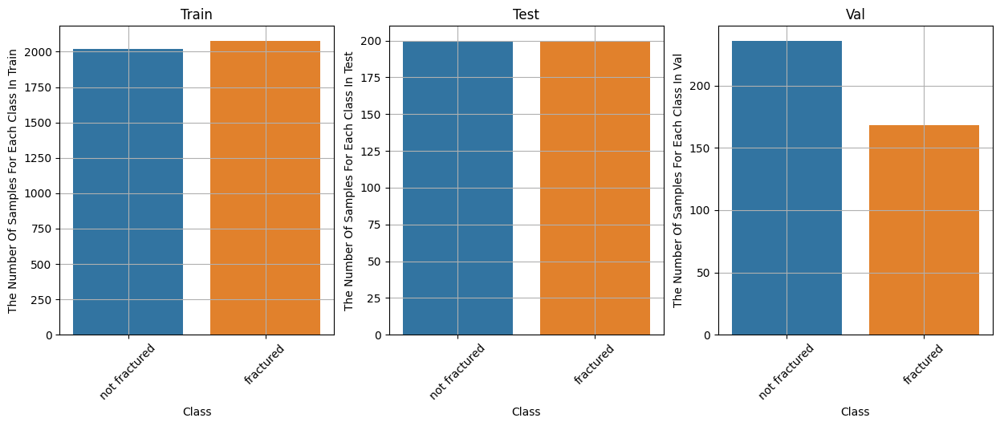

In [10]:
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
ax = sns.countplot(x=train.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,3,2)
ax = sns.countplot(x=test.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,3,3)
ax = sns.countplot(x=val.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Val")
plt.title('Val')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

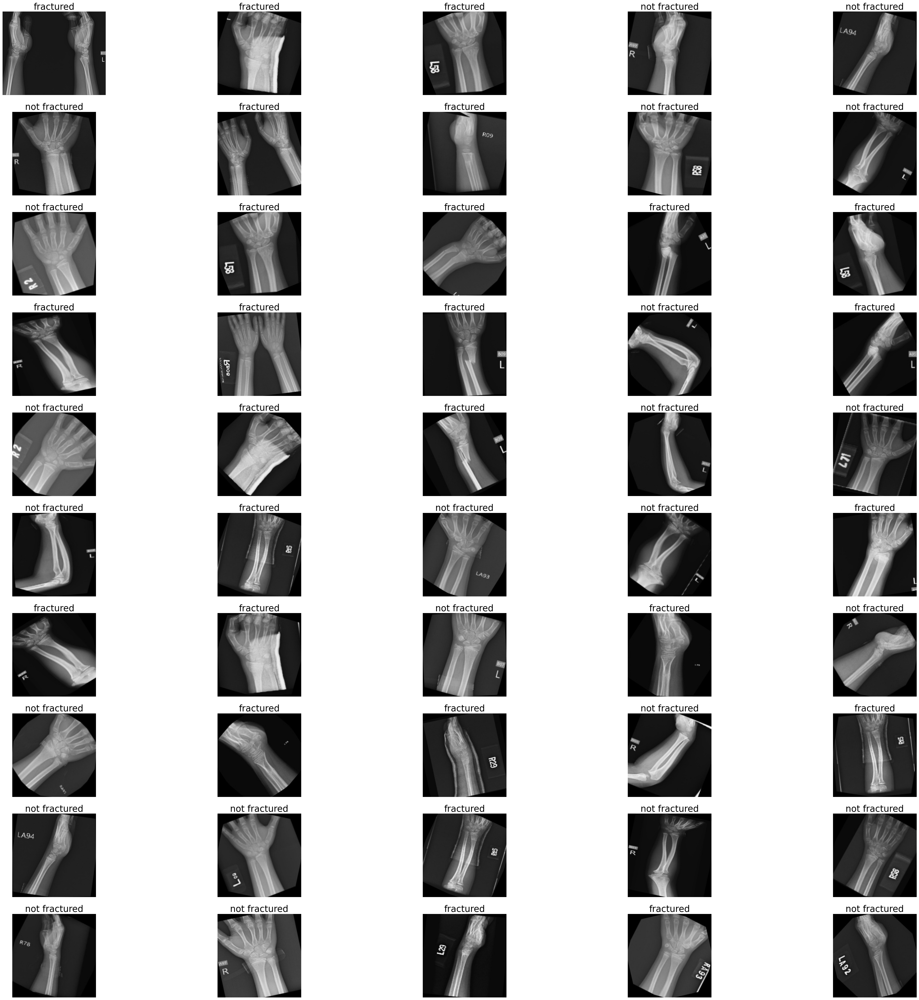

In [11]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(train),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(train.image[i])
    plt.imshow(img)
    plt.axis('off')
    plt.title(train.label[i],fontsize=25)

<a id="4"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Data Augmentation </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [12]:
image_size = (256, 256)
batch_size = 8
datagen = ImageDataGenerator(
    rescale=1./255
)
train_generator = datagen.flow_from_dataframe(
    train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True
)

Found 4097 validated image filenames belonging to 2 classes.
Found 399 validated image filenames belonging to 2 classes.
Found 404 validated image filenames belonging to 2 classes.


<a id="5"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Modeling </p>
<a class="btn" href="#home">Tabel of Contents</a>

![](https://i.ibb.co/sRbVRBN/image.png)

In [13]:
def inverted_residual_block(inputs, num_filters, strides=1, expansion_ratio=1):
    ## Point-Wise Convolution
    x = keras.layers.Conv2D(
        filters=expansion_ratio*inputs.shape[-1],
        kernel_size=1,
        padding="same",
        use_bias=False
    )(inputs)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("swish")(x)

    ## Depth-Wise Convolution
    x = keras.layers.DepthwiseConv2D(
        kernel_size=3,
        strides=strides,
        padding="same",
        use_bias=False
    )(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("swish")(x)

    ## Point-Wise Convolution
    x = keras.layers.Conv2D(
        filters=num_filters,
        kernel_size=1,
        padding="same",
        use_bias=False
    )(x)
    x = keras.layers.BatchNormalization()(x)

    ## Residual Connection
    if strides == 1 and (inputs.shape == x.shape):
        return keras.layers.Add()([inputs, x])
    return x

In [14]:
def mlp(x, mlp_dim, dim, dropout_rate=0.1):
    x = keras.layers.Dense(mlp_dim, activation="swish")(x)
    x = keras.layers.Dropout(dropout_rate)(x)
    x = keras.layers.Dense(dim)(x)
    x = keras.layers.Dropout(dropout_rate)(x)
    return x

In [15]:
def transformer_encoder(x, num_heads, dim, mlp_dim):
    skip_1 = x
    x = keras.layers.LayerNormalization()(x)
    x = keras.layers.MultiHeadAttention(
        num_heads=num_heads, key_dim=dim
    )(x, x)
    x = keras.layers.Add()([x, skip_1])

    skip_2 = x
    x = keras.layers.LayerNormalization()(x)
    x = mlp(x, mlp_dim, dim)
    x = keras.layers.Add()([x, skip_2])

    return x

In [16]:
def mobile_vit_block(inputs, num_filters, dim, patch_size=2, num_layers=1):
    B, H, W, C = inputs.shape

    ## 3x3 conv
    x = keras.layers.Conv2D(
        filters=C,
        kernel_size=3,
        padding="same",
        use_bias=False
    )(inputs)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("swish")(x)

    ## 1x1 conv: d-dimension
    x = keras.layers.Conv2D(
        filters=dim,
        kernel_size=1,
        padding="same",
        use_bias=False
    )(inputs)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("swish")(x)

    ## Reshape x to flattened patches
    P = patch_size*patch_size
    N = int(H*W//P)
    x = keras.layers.Reshape((P, N, dim))(x)

    ## Transformr Encoder
    for _ in range(num_layers):
        x = transformer_encoder(x, 1, dim, dim*2)

    ## Reshape
    x = keras.layers.Reshape((H, W, dim))(x)

    ## 1x1 conv: C-dimension
    x = keras.layers.Conv2D(
        filters=C,
        kernel_size=1,
        padding="same",
        use_bias=False
    )(inputs)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("swish")(x)

    ## Concatenation
    x = keras.layers.Concatenate()([x, inputs])

    ## 3x3 conv
    x = keras.layers.Conv2D(
        filters=num_filters,
        kernel_size=3,
        padding="same",
        use_bias=False
    )(inputs)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("swish")(x)

    return x

In [17]:
def MobileViT(input_shape, num_channels, dim, expansion_ratio, num_layers=[2, 4, 3], num_classes=1000):
    ## Input layer
    inputs = keras.layers.Input(input_shape)

    ## Stem
    x = keras.layers.Conv2D(
        filters=num_channels[0],
        kernel_size=3,
        strides=2,
        padding="same",
        use_bias=False
    )(inputs)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("swish")(x)
    x = inverted_residual_block(x, num_channels[1], strides=1, expansion_ratio=expansion_ratio)

    ## Stage 1
    x = inverted_residual_block(x, num_channels[2], strides=2, expansion_ratio=expansion_ratio)
    x = inverted_residual_block(x, num_channels[3], strides=1, expansion_ratio=expansion_ratio)
    x = inverted_residual_block(x, num_channels[4], strides=1, expansion_ratio=expansion_ratio)

    ## Stage 2
    x = inverted_residual_block(x, num_channels[5], strides=2, expansion_ratio=expansion_ratio)
    x = mobile_vit_block(x, num_channels[6], dim[0], num_layers=num_layers[0])

    ## Stage 3
    x = inverted_residual_block(x, num_channels[7], strides=2, expansion_ratio=expansion_ratio)
    x = mobile_vit_block(x, num_channels[8], dim[1], num_layers=num_layers[1])

    ## Stage 4
    x = inverted_residual_block(x, num_channels[9], strides=2, expansion_ratio=expansion_ratio)
    x = mobile_vit_block(x, num_channels[10], dim[2], num_layers=num_layers[2])
    x = keras.layers.Conv2D(
        filters=num_channels[11],
        kernel_size=1,
        padding="same",
        use_bias=False
    )(x)
    x = keras.layers.BatchNormalization()(x)
    x = keras.layers.Activation("swish")(x)

    ## Classifier
    x = keras.layers.Flatten()(x)
    x = keras.layers.Dense(512,activation='relu')(x)
    x = keras.layers.Dropout(.3)(x)
    x= keras.layers.Dense(256,activation='relu')(x)
    x= keras.layers.Dropout(.3)(x)
    outputs = keras.layers.Dense(num_classes, activation="sigmoid")(x)

    model = tf.keras.models.Model(inputs, outputs)
    return model

In [18]:
def MobileViT_S(input_shape, num_classes):
    num_channels = [16, 32, 64, 64, 64, 96, 144, 128, 192, 160, 240, 640]
    dim = [144, 192, 240]
    expansion_ratio = 4

    return MobileViT(
        input_shape,
        num_channels,
        dim,
        expansion_ratio,
        num_classes=num_classes
    )

In [19]:
def MobileViT_XS(input_shape, num_classes):
    num_channels = [16, 32, 48, 48, 48, 64, 96, 80, 120, 96, 144, 384]
    dim = [96, 120, 144]
    expansion_ratio = 4

    return MobileViT(
        input_shape,
        num_channels,
        dim,
        expansion_ratio,
        num_classes=num_classes
    )

In [20]:
def MobileViT_XXS(input_shape, num_classes):
    num_channels = [16, 16, 24, 24, 24, 48, 64, 64, 80, 80, 96, 320]
    dim = [64, 80, 96]
    expansion_ratio = 2

    return MobileViT(
        input_shape,
        num_channels,
        dim,
        expansion_ratio,
        num_classes=num_classes
    )

In [21]:
model = MobileViT_S((256, 256, 3), 1)

In [22]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 16)         432       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 128, 128, 16)         64        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 128, 128, 16)         0         ['batch_normalization[0][0

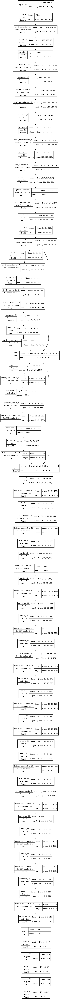

In [23]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [24]:
checkpoint_cb =ModelCheckpoint("my_keras_model1.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=5, restore_best_weights=True)
model.compile(optimizer ='adam', loss='binary_crossentropy', metrics=['accuracy',keras.metrics.SpecificityAtSensitivity(0.5),keras.metrics.AUC()])
hist=model.fit(train_generator,epochs=10,validation_data=val_generator,callbacks=[checkpoint_cb,early_stopping_cb])

Epoch 1/10
513/513 [==============================] - ETA: 0s - loss: 0.7196 - accuracy: 0.7269 - specificity_at_sensitivity: 0.8850 - auc: 0.7903

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


513/513 [==============================] - 1065s 2s/step - loss: 0.7196 - accuracy: 0.7269 - specificity_at_sensitivity: 0.8850 - auc: 0.7903 - val_loss: 0.7003 - val_accuracy: 0.6040 - val_specificity_at_sensitivity: 0.8929 - val_auc: 0.7934
Epoch 2/10
513/513 [==============================] - 1034s 2s/step - loss: 0.3184 - accuracy: 0.8777 - specificity_at_sensitivity: 0.9827 - auc: 0.9432 - val_loss: 1.1931 - val_accuracy: 0.7475 - val_specificity_at_sensitivity: 0.9583 - val_auc: 0.8500
Epoch 3/10
513/513 [==============================] - 1016s 2s/step - loss: 0.2395 - accuracy: 0.9197 - specificity_at_sensitivity: 0.9899 - auc: 0.9670 - val_loss: 0.1026 - val_accuracy: 0.9653 - val_specificity_at_sensitivity: 1.0000 - val_auc: 0.9936
Epoch 4/10
513/513 [==============================] - 1026s 2s/step - loss: 0.1321 - accuracy: 0.9495 - specificity_at_sensitivity: 0.9995 - auc: 0.9889 - val_loss: 0.1035 - val_accuracy: 0.9653 - val_specificity_at_sensitivity: 0.9940 - val_auc: 0.

<a id="6"></a>
# <p style="background-image: url(https://i.postimg.cc/K87ByXmr/stage5.jpg);font-family:camtasia;font-size:120%;color:white;text-align:center;border-radius:15px 50px; padding:7px"> Evaluate The Model  </p>
<a class="btn" href="#home">Tabel of Contents</a>

In [25]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,specificity_at_sensitivity,auc,val_loss,val_accuracy,val_specificity_at_sensitivity,val_auc
0,0.719574,0.726873,0.884986,0.790323,0.700314,0.603960,0.892857,0.793357
1,0.318386,0.877715,0.982676,0.943168,1.193100,0.747525,0.958333,0.850018
2,0.239549,0.919697,0.989894,0.967034,0.102562,0.965347,1.000000,0.993631
3,0.132068,0.949475,0.999519,0.988898,0.103540,0.965347,0.994048,0.994073
4,0.130574,0.955089,0.998075,0.988765,0.024129,0.995049,1.000000,1.000000
5,0.264928,0.893093,0.993744,0.961976,0.115232,0.955446,0.994048,0.992005
6,0.087063,0.972175,0.997113,0.994093,0.036995,0.982673,1.000000,0.999496
7,0.099689,0.969734,0.995669,0.992452,0.313211,0.915842,0.994048,0.972950
8,0.114582,0.965340,0.997113,0.991679,0.024831,0.990099,1.000000,0.999584
9,0.050070,0.981938,0.998556,0.997667,0.025028,0.995049,1.000000,0.999975


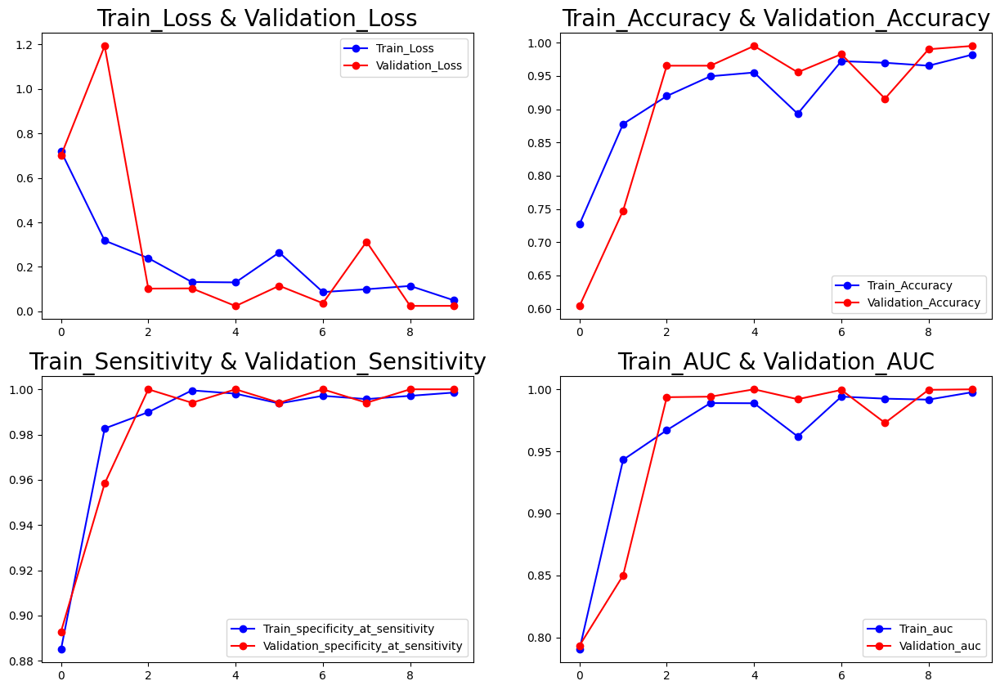

In [26]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_.iloc[:,0],'b-o',label='Train_Loss')
plt.plot(hist_.iloc[:,4],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_.iloc[:,1],'b-o',label='Train_Accuracy')
plt.plot(hist_.iloc[:,5],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_.iloc[:,2],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_.iloc[:,6],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_.iloc[:,3],'b-o',label='Train_auc')
plt.plot(hist_.iloc[:,-1],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [27]:
score, acc,sensitivity,auc = model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

50/50 [==============================] - 16s 317ms/step - loss: 0.0541 - accuracy: 0.9774 - specificity_at_sensitivity: 1.0000 - auc: 0.9993
Test Loss = 0.05407007038593292
Test Accuracy = 0.9774436354637146
Test Sensitivity = 1.0
Test AUC = 0.9992714524269104


In [28]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.where(predictions >= 0.5, 1, 0)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

50/50 [==============================] - 17s 324ms/step


,Actual,Prediction
0,1,1
1,1,1
2,1,0
3,1,1
4,1,1
...,...,...
394,0,0
395,0,0
396,0,0
397,0,0


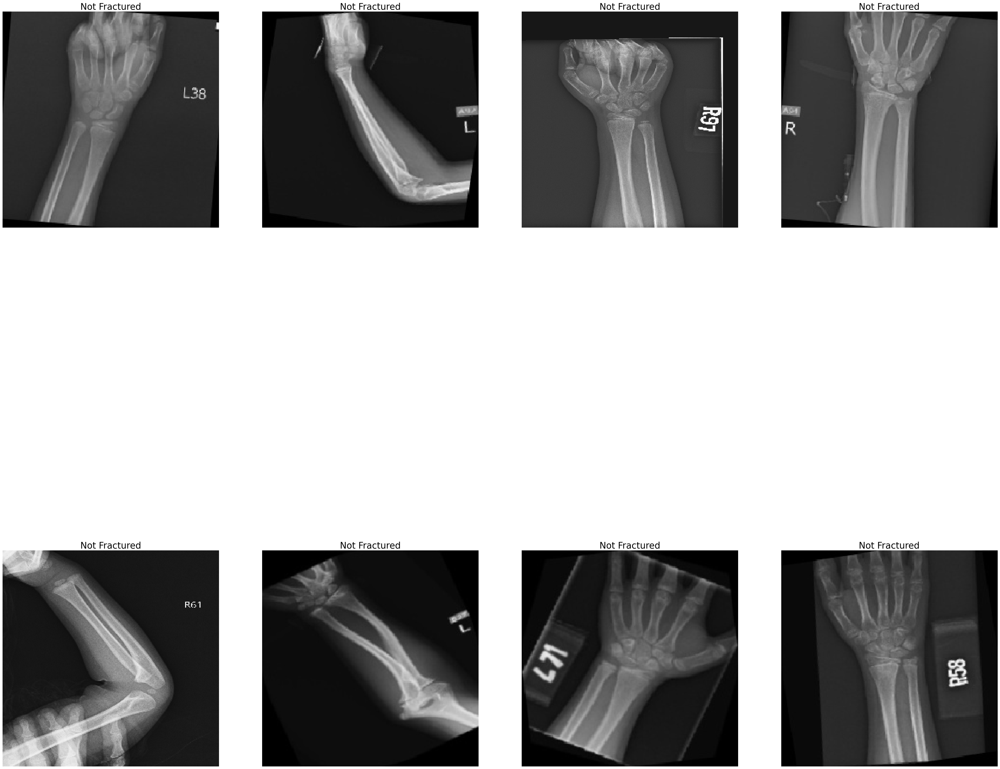

In [29]:
class_names=['Fractured', 'Not Fractured']
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(8):
    plt.subplot(2,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(class_names[int(y_test[n])],fontsize=25)

array([[198,   1],
       [  8, 192]])

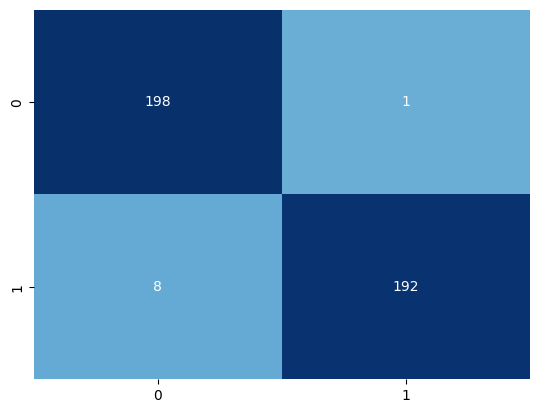

In [30]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [31]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.96      0.99      0.98       199
           1       0.99      0.96      0.98       200

    accuracy                           0.98       399
   macro avg       0.98      0.98      0.98       399
weighted avg       0.98      0.98      0.98       399



In [32]:
model = MobileViT_XS((256, 256, 3), 1)

In [33]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_28 (Conv2D)          (None, 128, 128, 16)         432       ['input_2[0][0]']             
                                                                                                  
 batch_normalization_35 (Ba  (None, 128, 128, 16)         64        ['conv2d_28[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_28 (Activation)  (None, 128, 128, 16)         0         ['batch_normalization_35

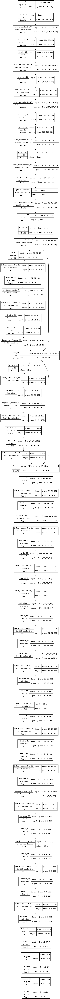

In [34]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [35]:
checkpoint_cb =ModelCheckpoint("my_keras_model2.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=5, restore_best_weights=True)
model.compile(optimizer ='adam', loss='binary_crossentropy', metrics=['accuracy',keras.metrics.SpecificityAtSensitivity(0.5),keras.metrics.AUC()])
hist=model.fit(train_generator,epochs=10,validation_data=val_generator,callbacks=[checkpoint_cb,early_stopping_cb])

Epoch 1/10
513/513 [==============================] - ETA: 0s - loss: 0.6312 - accuracy: 0.7796 - specificity_at_sensitivity_1: 0.9230 - auc_1: 0.8470

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


513/513 [==============================] - 720s 1s/step - loss: 0.6312 - accuracy: 0.7796 - specificity_at_sensitivity_1: 0.9230 - auc_1: 0.8470 - val_loss: 1.0028 - val_accuracy: 0.5842 - val_specificity_at_sensitivity_1: 0.6131 - val_auc_1: 0.6866
Epoch 2/10
513/513 [==============================] - 722s 1s/step - loss: 0.2485 - accuracy: 0.9068 - specificity_at_sensitivity_1: 0.9937 - auc_1: 0.9649 - val_loss: 0.0888 - val_accuracy: 0.9678 - val_specificity_at_sensitivity_1: 1.0000 - val_auc_1: 0.9956
Epoch 3/10
513/513 [==============================] - 722s 1s/step - loss: 0.1535 - accuracy: 0.9434 - specificity_at_sensitivity_1: 0.9966 - auc_1: 0.9852 - val_loss: 0.1253 - val_accuracy: 0.9653 - val_specificity_at_sensitivity_1: 1.0000 - val_auc_1: 0.9935
Epoch 4/10
513/513 [==============================] - 722s 1s/step - loss: 0.1156 - accuracy: 0.9634 - specificity_at_sensitivity_1: 0.9971 - auc_1: 0.9911 - val_loss: 0.4756 - val_accuracy: 0.8391 - val_specificity_at_sensitivi

In [36]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,specificity_at_sensitivity_1,auc_1,val_loss,val_accuracy,val_specificity_at_sensitivity_1,val_auc_1
0,0.631173,0.779595,0.923003,0.847000,1.002844,0.584158,0.613095,0.686592
1,0.248534,0.906761,0.993744,0.964903,0.088767,0.967822,1.000000,0.995599
2,0.153506,0.943373,0.996631,0.985170,0.125323,0.965347,1.000000,0.993543
3,0.115648,0.963388,0.997113,0.991070,0.475555,0.839109,0.988095,0.948925
4,0.125399,0.960459,0.996150,0.989633,0.106132,0.965347,1.000000,0.997528
5,0.053752,0.983891,0.998556,0.997005,0.242361,0.918317,1.000000,0.983480
6,0.096650,0.968758,0.997594,0.993698,0.037171,0.987624,1.000000,0.999243
7,0.167119,0.948011,0.994706,0.982537,0.033999,0.982673,1.000000,0.999521
8,0.042312,0.986331,0.999519,0.998092,0.015786,0.995049,1.000000,0.999874
9,0.040577,0.986576,0.999038,0.998179,0.835346,0.841584,1.000000,0.939795


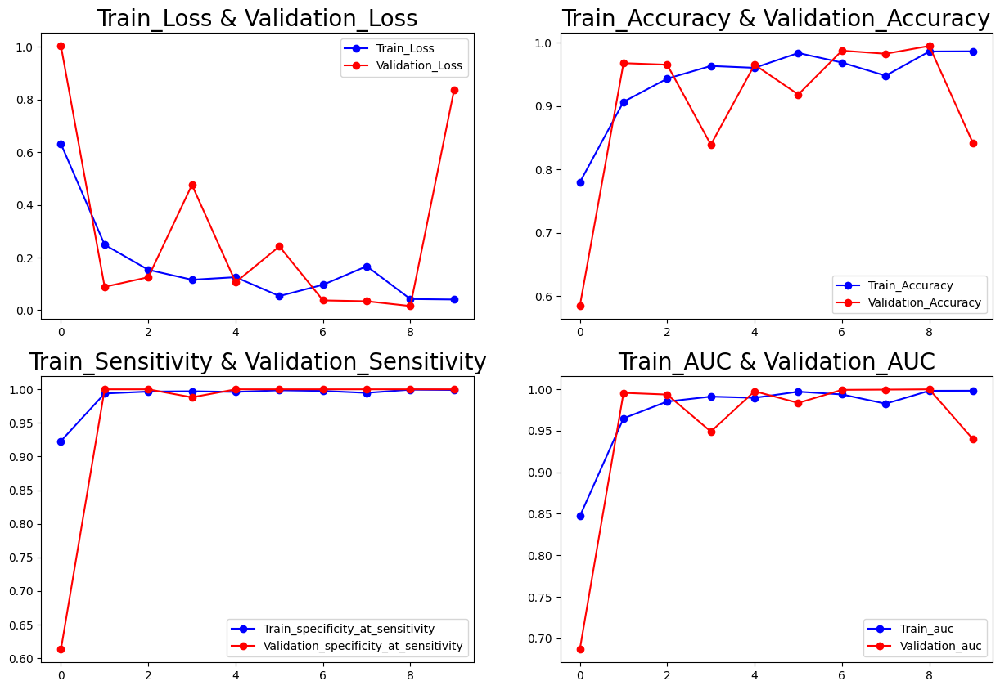

In [37]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_.iloc[:,0],'b-o',label='Train_Loss')
plt.plot(hist_.iloc[:,4],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_.iloc[:,1],'b-o',label='Train_Accuracy')
plt.plot(hist_.iloc[:,5],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_.iloc[:,2],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_.iloc[:,6],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_.iloc[:,3],'b-o',label='Train_auc')
plt.plot(hist_.iloc[:,-1],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [38]:
score, acc,sensitivity,auc = model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

50/50 [==============================] - 13s 257ms/step - loss: 1.0726 - accuracy: 0.8246 - specificity_at_sensitivity_1: 1.0000 - auc_1: 0.9192
Test Loss = 1.0726438760757446
Test Accuracy = 0.8245614171028137
Test Sensitivity = 1.0
Test AUC = 0.9191708564758301


In [39]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.where(predictions >= 0.5, 1, 0)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

50/50 [==============================] - 13s 259ms/step


,Actual,Prediction
0,1,1
1,1,1
2,1,0
3,1,1
4,1,1
...,...,...
394,0,0
395,0,0
396,0,0
397,0,0


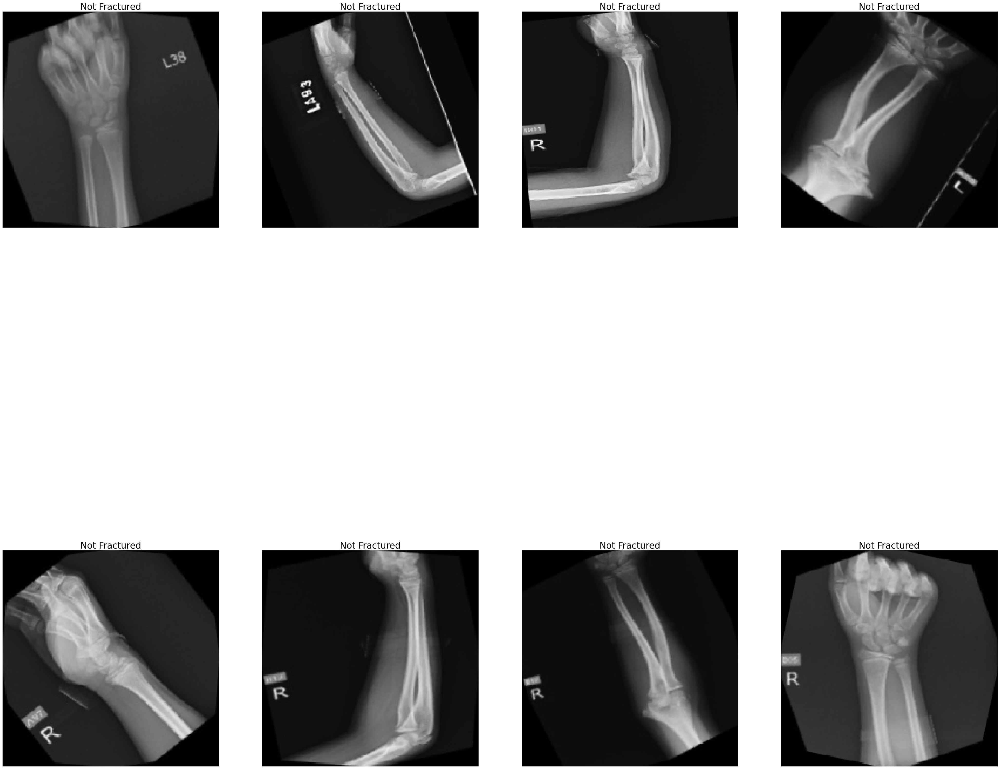

In [40]:
class_names=['Fractured', 'Not Fractured']
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(8):
    plt.subplot(2,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(class_names[int(y_test[n])],fontsize=25)
    

array([[199,   0],
       [ 70, 130]])

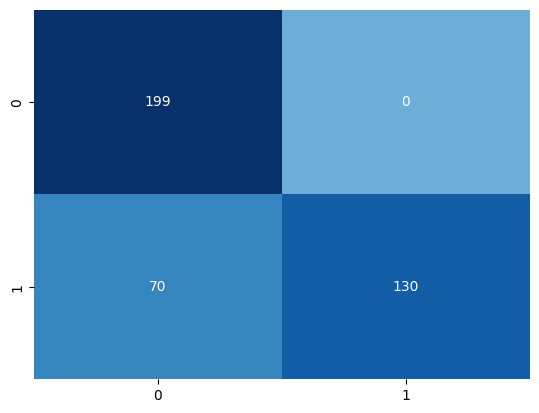

In [41]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [42]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.74      1.00      0.85       199
           1       1.00      0.65      0.79       200

    accuracy                           0.82       399
   macro avg       0.87      0.82      0.82       399
weighted avg       0.87      0.82      0.82       399



In [43]:
model = MobileViT_XXS((256, 256, 3), 1)

In [44]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d_56 (Conv2D)          (None, 128, 128, 16)         432       ['input_3[0][0]']             
                                                                                                  
 batch_normalization_70 (Ba  (None, 128, 128, 16)         64        ['conv2d_56[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 activation_56 (Activation)  (None, 128, 128, 16)         0         ['batch_normalization_70

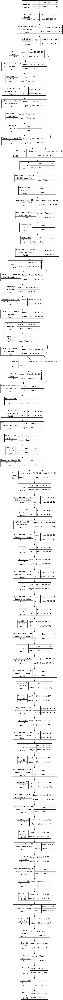

In [45]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [46]:
checkpoint_cb =ModelCheckpoint("my_keras_model2.h5", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=5, restore_best_weights=True)
model.compile(optimizer ='adam', loss='binary_crossentropy', metrics=['accuracy',keras.metrics.SpecificityAtSensitivity(0.5),keras.metrics.AUC()])
hist=model.fit(train_generator,epochs=10,validation_data=val_generator,callbacks=[checkpoint_cb,early_stopping_cb])

Epoch 1/10
513/513 [==============================] - ETA: 0s - loss: 0.5511 - accuracy: 0.7962 - specificity_at_sensitivity_2: 0.9326 - auc_2: 0.8678

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


513/513 [==============================] - 262s 496ms/step - loss: 0.5511 - accuracy: 0.7962 - specificity_at_sensitivity_2: 0.9326 - auc_2: 0.8678 - val_loss: 0.5540 - val_accuracy: 0.7401 - val_specificity_at_sensitivity_2: 0.8452 - val_auc_2: 0.8184
Epoch 2/10
513/513 [==============================] - 252s 491ms/step - loss: 0.1908 - accuracy: 0.9334 - specificity_at_sensitivity_2: 0.9952 - auc_2: 0.9783 - val_loss: 0.1129 - val_accuracy: 0.9579 - val_specificity_at_sensitivity_2: 1.0000 - val_auc_2: 0.9951
Epoch 3/10
513/513 [==============================] - 252s 490ms/step - loss: 0.1332 - accuracy: 0.9563 - specificity_at_sensitivity_2: 0.9990 - auc_2: 0.9891 - val_loss: 0.3526 - val_accuracy: 0.8960 - val_specificity_at_sensitivity_2: 1.0000 - val_auc_2: 0.9836
Epoch 4/10
513/513 [==============================] - 253s 493ms/step - loss: 0.1040 - accuracy: 0.9666 - specificity_at_sensitivity_2: 0.9976 - auc_2: 0.9924 - val_loss: 0.2530 - val_accuracy: 0.8663 - val_specificity_

In [47]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,specificity_at_sensitivity_2,auc_2,val_loss,val_accuracy,val_specificity_at_sensitivity_2,val_auc_2
0,0.551106,0.796192,0.932627,0.867753,0.553971,0.740099,0.845238,0.818427
1,0.190821,0.933366,0.995188,0.978254,0.112867,0.957921,1.000000,0.995094
2,0.133209,0.956309,0.999038,0.989065,0.352606,0.896040,1.000000,0.983618
3,0.104024,0.966561,0.997594,0.992417,0.253018,0.866337,1.000000,0.968157
4,0.084982,0.974616,0.996631,0.994005,0.068199,0.967822,1.000000,0.998020
5,0.062581,0.981450,0.998075,0.995936,0.013788,0.995049,1.000000,0.999975
6,0.107873,0.967537,0.996150,0.992356,0.037482,0.987624,0.994048,0.996923
7,0.085118,0.970954,0.996631,0.993641,0.330480,0.948020,0.970238,0.973227
8,0.060696,0.982426,0.998075,0.996316,0.016765,0.990099,1.000000,0.999849
9,0.039807,0.990725,0.998075,0.997522,0.011405,0.995049,1.000000,0.999874


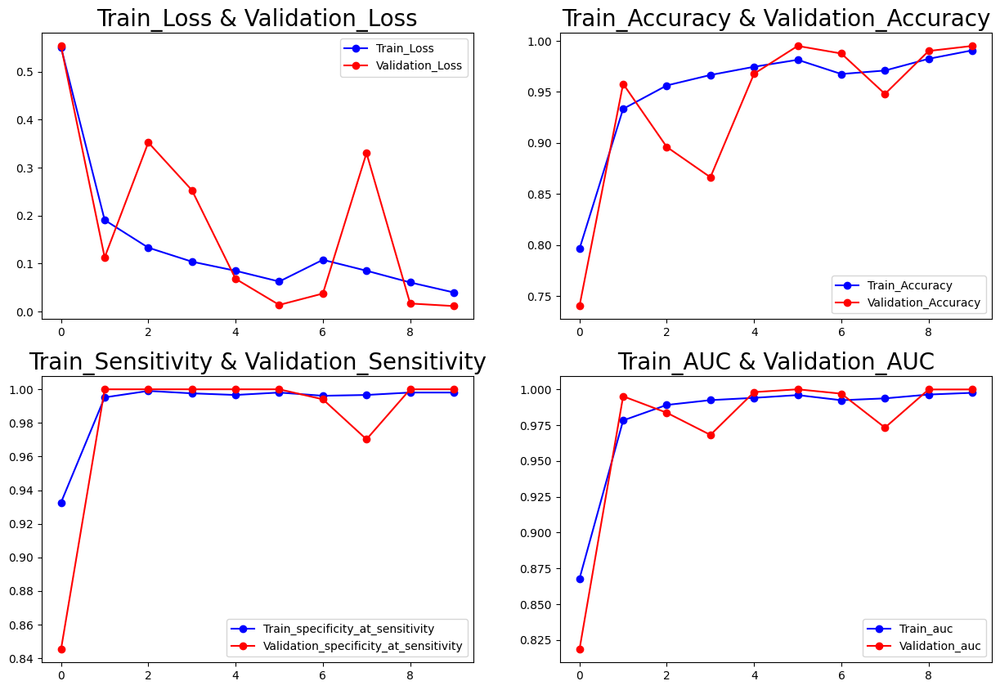

In [48]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_.iloc[:,0],'b-o',label='Train_Loss')
plt.plot(hist_.iloc[:,4],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_.iloc[:,1],'b-o',label='Train_Accuracy')
plt.plot(hist_.iloc[:,5],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_.iloc[:,2],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_.iloc[:,6],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_.iloc[:,3],'b-o',label='Train_auc')
plt.plot(hist_.iloc[:,-1],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [49]:
score, acc,sensitivity,auc = model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

50/50 [==============================] - 5s 92ms/step - loss: 0.0427 - accuracy: 0.9875 - specificity_at_sensitivity_2: 1.0000 - auc_2: 0.9986
Test Loss = 0.04267212003469467
Test Accuracy = 0.9874686598777771
Test Sensitivity = 1.0
Test AUC = 0.9986432194709778


In [50]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.where(predictions >= 0.5, 1, 0)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

50/50 [==============================] - 5s 94ms/step


,Actual,Prediction
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
394,0,0
395,0,1
396,0,0
397,0,0


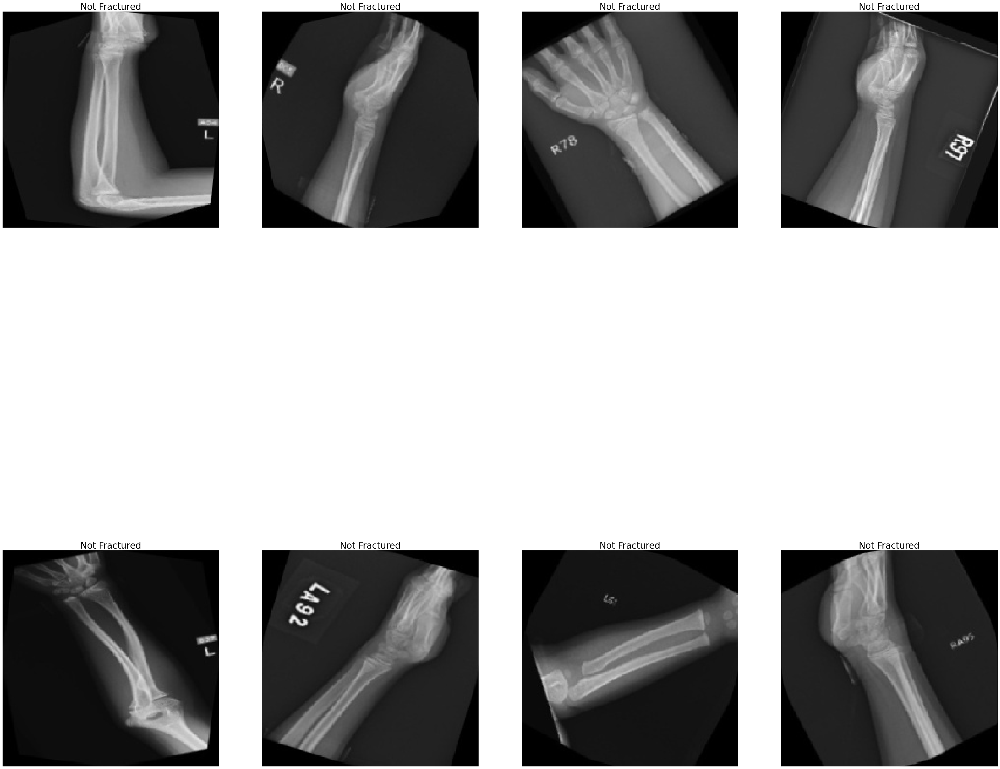

In [51]:
class_names=['Fractured', 'Not Fractured']
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(8):
    plt.subplot(2,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(class_names[int(y_test[n])],fontsize=25)
    

array([[196,   3],
       [  2, 198]])

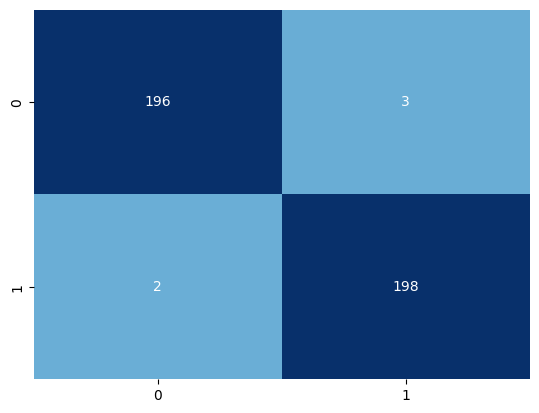

In [52]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [53]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.99      0.98      0.99       199
           1       0.99      0.99      0.99       200

    accuracy                           0.99       399
   macro avg       0.99      0.99      0.99       399
weighted avg       0.99      0.99      0.99       399

